<a href="https://colab.research.google.com/github/shreyus3003/GenAI/blob/main/Stable%20Diffusion/Course_Stable_Diffusion_Part_6_ControlNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ControlNet with Stable Diffusion

Other ways to guide the result, in terms of composition and general pose of the image. There is a task called depth-to-image, where both a text prompt and a depth image are used to condition the model. This allows you to get even more accurate results than the "common" image-to-image technique. (examples [(1)](https://huggingface.co/stabilityai/stable-diffusion-2-depth) [(2)](https://www.google.com/search?q=Depth-to-Image+examples&hl=pt-BR&sxsrf=APwXEdfEg0GPiQxAYEWAXzU-mpX1_FP0oA:1684148085124&source=lnms&tbm=isch&sa=X&ved=2ahUKEwjErPPClPf-AhVFBbkGHal1B60Q_AUoAXoECAEQAw&biw=2180&bih=1005&dpr=0.88))

The original paper proposed 8 conditioning models, but since then some new ones have appeared. Some examples:

 * Edge detection
  * [Canny Edge](https://github.com/lllyasviel/ControlNet#controlnet-with-canny-edge)
  * [HED Boundary](https://github.com/lllyasviel/ControlNet#controlnet-with-hed-boundary) (holistically-nested edge detection)
 * [Poses](https://github.com/lllyasviel/ControlNet#controlnet-with-human-pose)
 * [Scratches)](https://github.com/lllyasviel/ControlNet#controlnet-with-user-scribbles)
 * [Image segmentation](https://github.com/lllyasviel/ControlNet#controlnet-with-semantic-segmentation)
 * [Depth map](https://github.com/lllyasviel/ControlNet#controlnet-with-depth)
 * Official repository for more examples: https://github.com/lllyasviel/ControlNet

### About the technique

- Paper [Adding Conditional Control to Text-to-Image Diffusion Models](https://arxiv.org/abs/2302.05543) published in February 2023
- ControlNet was developed from the idea that only text is not enough to solve all problems in image generation.
* First version: https://github.com/lllyasviel/ControlNet#below-is-controlnet-10
* Diagram and additional explanation: https://github.com/lllyasviel/ControlNet#stable-diffusion--controlnet

Paper: https://arxiv.org/pdf/2302.05543.pdf


We are going to implement two ways to condition the model:
 * Edge detection (using Canny Edge)
 * Pose estimation (using Open Pose)

## Installing the libraries

In [ ]:
!pip install torch==1.13.1 torchvision==0.14.1 torchaudio==0.13.1 torchdata==0.5.1 torchtext==0.14.1

In [ ]:
!pip install diffusers==0.14
!pip install -q accelerate transformers xformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 75.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.1/109.1 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 82.5 MB/s eta 0:00:00


In [ ]:
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.0/231.0 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.6 MB/s eta 0:00:00


In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
import cv2 #OpenCV
from PIL import Image
import numpy as np

In [ ]:
def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
      img = img.resize((w,h), Image.ANTIALIAS)
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

## Generating images using edges



### ControlNet model + Canny Edge

- More information about the model: https://huggingface.co/lllyasviel/sd-controlnet-canny


In [ ]:
controlnet_canny_model = 'lllyasviel/sd-controlnet-canny'
control_net_canny = ControlNetModel.from_pretrained(controlnet_canny_model, torch_dtype=torch.float16)

In [ ]:
pipe = StableDiffusionControlNetPipeline.from_pretrained('runwayml/stable-diffusion-v1-5',
                                                         controlnet=control_net_canny,
                                                         torch_dtype=torch.float16)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [ ]:
from diffusers import UniPCMultistepScheduler
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

In [ ]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [ ]:
pipe.enable_model_cpu_offload()

### Loading the image

- Image source: https://unsplash.com/pt-br/fotografias/OjhSUsHUIYM

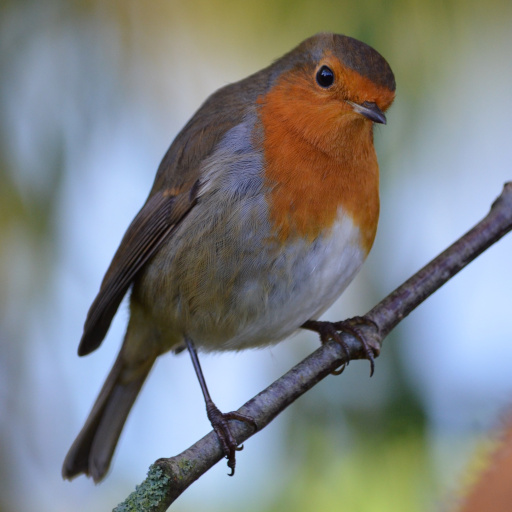

In [ ]:
img = Image.open('/content/bird.jpg')
img

In [ ]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

### Detecting edges using Canny Edge  

* More about the algorithm: http://justin-liang.com/tutorials/canny/
* More about the implemetation in OpenCV: https://docs.opencv.org/3.4/da/d22/tutorial_py_canny.html



In [ ]:
def canny_edge(img, low_threshold = 100, high_threshold = 200):
  img = np.array(img)
  #print(type(img))
  #print(img.shape)
  img = cv2.Canny(img, low_threshold, high_threshold)
  #print(img.shape)
  img = img[:, :, None]
  #print(img.shape)
  img = np.concatenate([img, img, img], axis = 2)
  #print(img.shape)
  canny_img = Image.fromarray(img)
  #print(type(canny_img))
  return canny_img

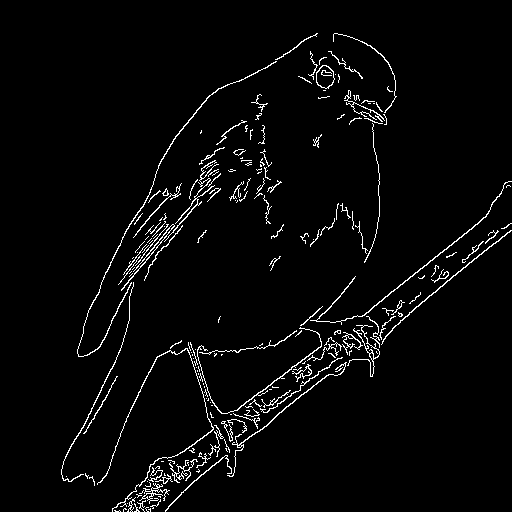

In [ ]:
canny_img = canny_edge(img)
canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

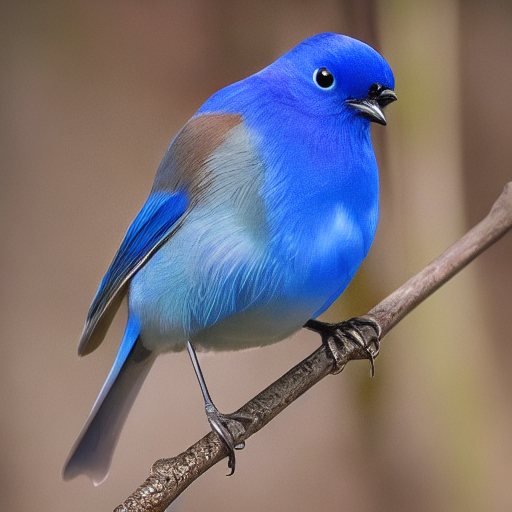

In [ ]:
prompt = "realistic photo of a blue bird with purple details, high quality, natural light"
neg_prompt = ""

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

imgs.images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

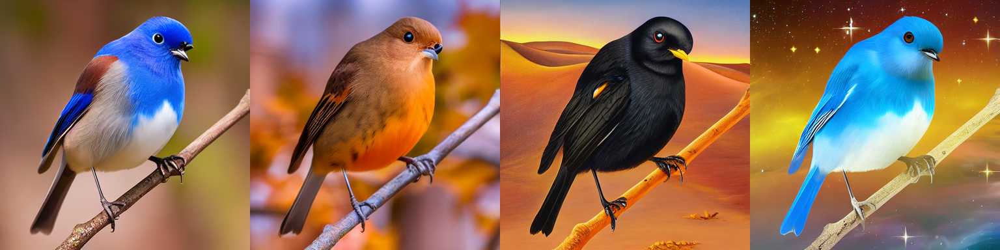

In [ ]:
prompt = ["realistic photo of a blue bird with purple details, high quality, natural light",
          "realistic photo of a bird in new york during autumn, city in the background",
          "oil painting of a black bird in the desert, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "digital painting of a blue bird in space, stars and galaxy in the background, trending on artstation"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

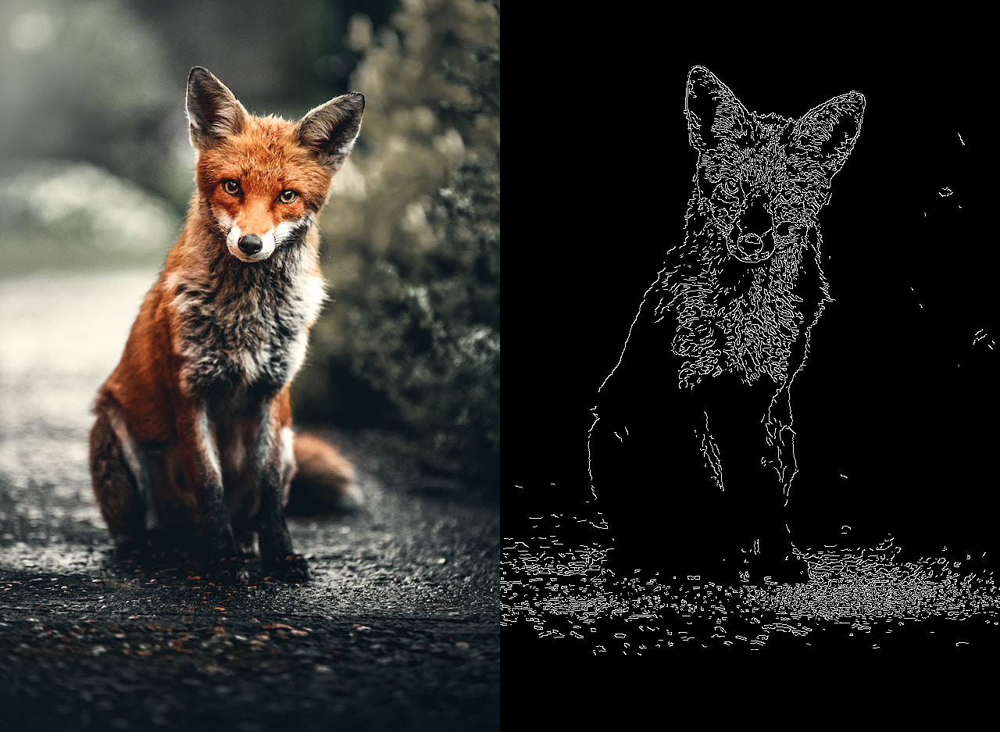

In [ ]:
img = Image.open("fox.jpg")

canny_img = canny_edge(img, 200, 255)

grid_img([img, canny_img], 1, 2)

  0%|          | 0/20 [00:00<?, ?it/s]

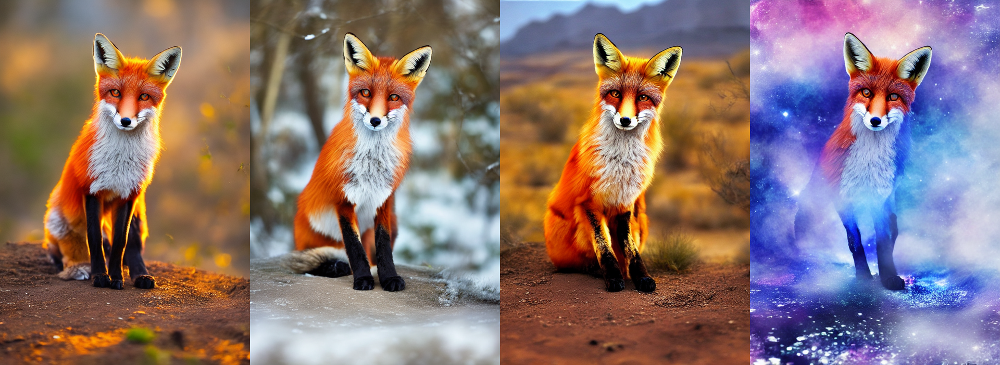

In [ ]:
prompt = ["realistic photo of a fox, high quality, natural light, sunset",
          "realistic photo of a fox in the snow, best quality, extremely detailed",
          "oil painting of fox the desert, canyons in the background, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "watercolor painting of a fox in space, blue and purple tones, stars and earth in the background"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

### Example using fine-tuned model

- More about the model: https://huggingface.co/sd-dreambooth-library/mr-potato-head




In [ ]:
mph = StableDiffusionControlNetPipeline.from_pretrained("sd-dreambooth-library/mr-potato-head", controlnet=control_net_canny, torch_dtype=torch.float16)
mph.scheduler = UniPCMultistepScheduler.from_config(mph.scheduler.config)
mph.enable_model_cpu_offload()
mph.enable_xformers_memory_efficient_attention()

safety_checker/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


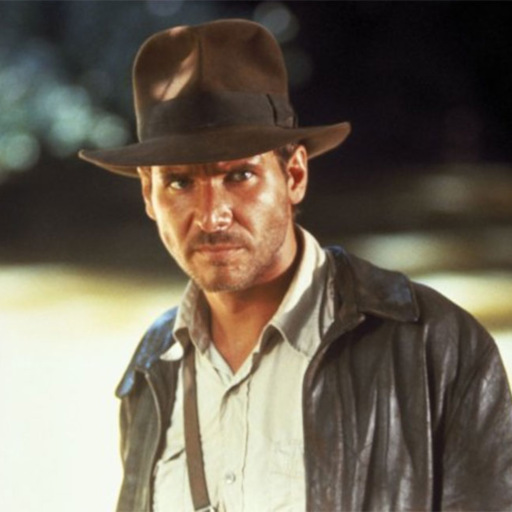

In [ ]:
img = Image.open("indiana-jones.jpg")
img

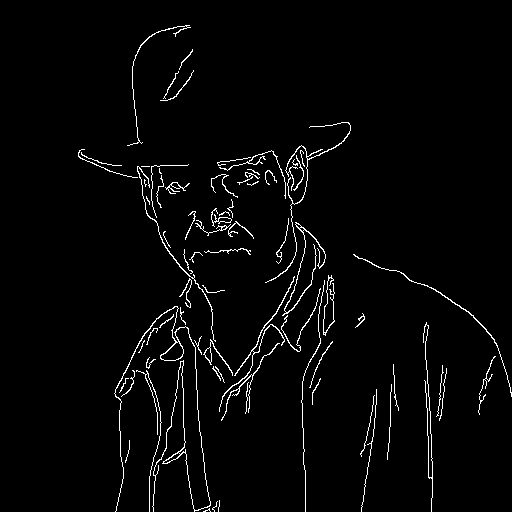

In [ ]:
canny_img = canny_edge(img, 100, 255)
canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

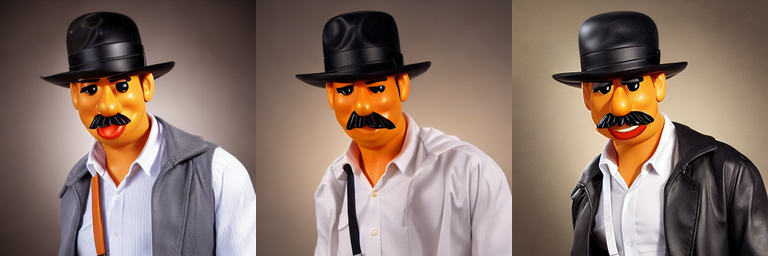

In [ ]:
prompt = "photo of sks mr potato head wearing a black hat, best quality, extremely detailed"
neg_prompt = "ugly, desfigured, distorted face, poorly drawn face, monochrome"
num_imgs = 3

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)
mph.safety_checker = None

imgs = mph(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    num_images_per_prompt=num_imgs,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, num_imgs, 0.5)

## Generating images using poses

- 3D software to create posed images:
  * Magicposer: https://magicposer.com/
  * Posemyart: https://posemy.art/



### Loading the model to extract poses

In [ ]:
from controlnet_aux import OpenposeDetector
pose_model = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')

/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(


### Loading the image

In [ ]:
img_pose = Image.open('/content/pose01.jpg')

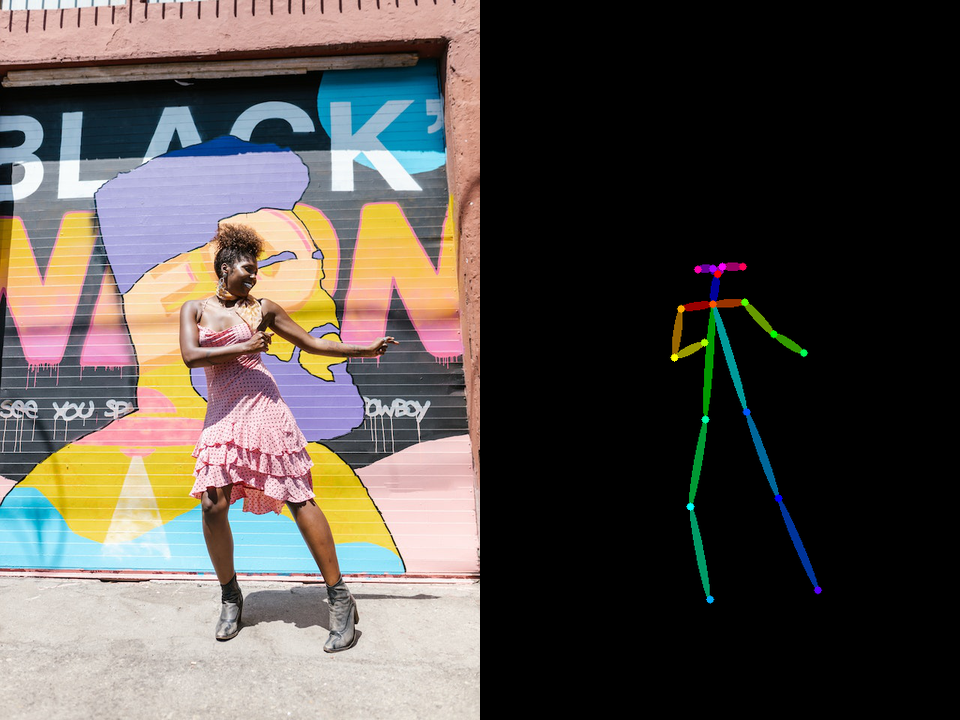

In [ ]:
pose = pose_model(img_pose)
grid_img([img_pose, pose], rows=1, cols=2, scale=0.75)

### Loading the ControlNet model

- More about the model: https://huggingface.co/lllyasviel/sd-controlnet-openpose


In [ ]:
controlnet_pose_model = ControlNetModel.from_pretrained('thibaud/controlnet-sd21-openpose-diffusers', torch_dtype=torch.float16)
sd_controlpose = StableDiffusionControlNetPipeline.from_pretrained('stabilityai/stable-diffusion-2-1-base',
                                                                   controlnet=controlnet_pose_model,
                                                                   torch_dtype=torch.float16)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [ ]:
sd_controlpose.enable_model_cpu_offload()
sd_controlpose.enable_attention_slicing()
sd_controlpose.enable_xformers_memory_efficient_attention()

In [ ]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

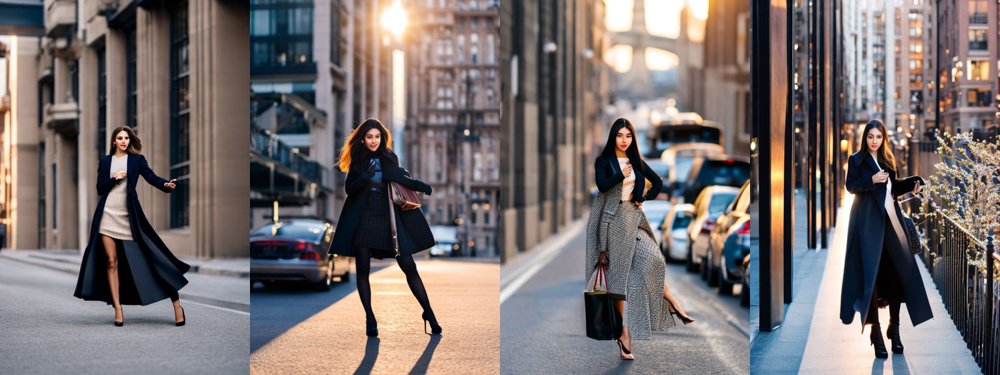

In [ ]:
seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)
prompt = "professional photo of a young woman in the street, wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)

> Other tests

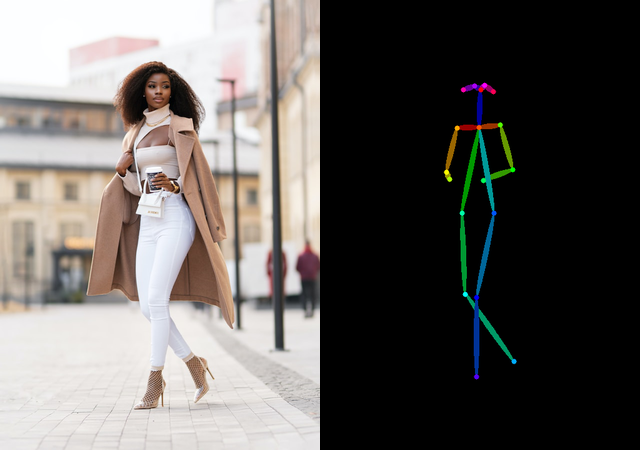

In [ ]:
img_pose = Image.open("pose02.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

  0%|          | 0/20 [00:00<?, ?it/s]

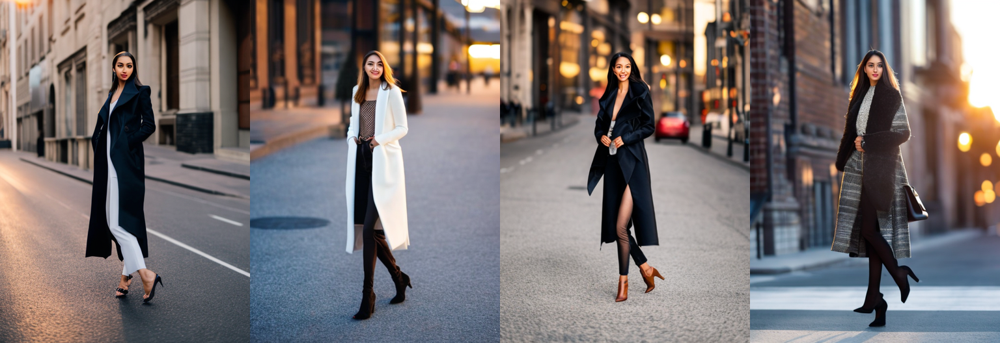

In [ ]:
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)


**To improve the results:**

* Test with differente schedulers. Euler A is also recommended for ControlNet
* Change the parameters (CFG, steps, etc.)
* Use good negative prompts
* Adjust the prompt to be similar to the initial pose
* It is recommended to provide more information regarding the action. For example, "walking in the street" tends to return better results than "in the street"
* You can use Inpainting to adjust faces that have not been correctly generated

  0%|          | 0/20 [00:00<?, ?it/s]

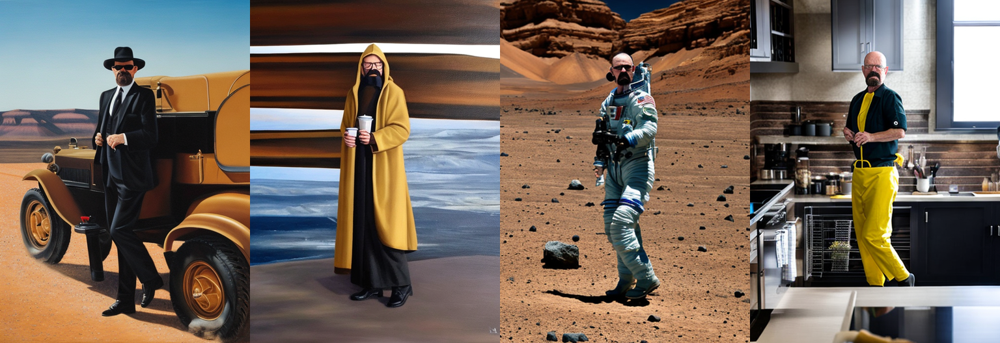

In [ ]:
prompt = ["oil painting walter white wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting walter white wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of walter white wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of walter white in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)
num_imgs = 1

generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

sd_controlpose.scheduler = EulerAncestralDiscreteScheduler.from_config(sd_controlpose.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

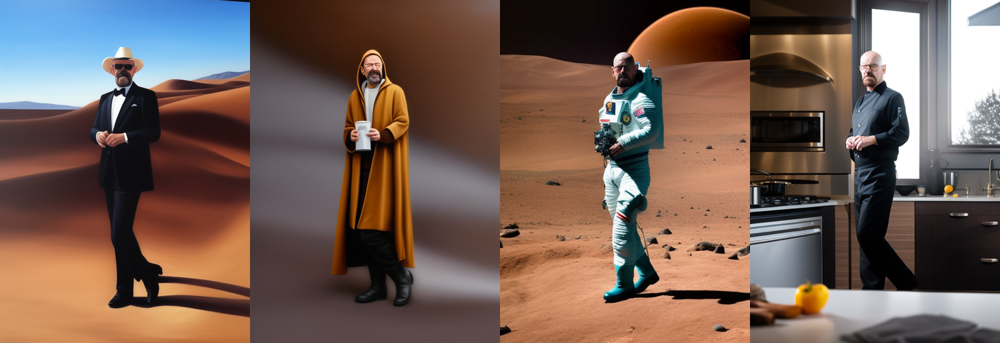

In [ ]:
generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [ ]:
from diffusers.utils import load_image

In [ ]:
urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url) for url in urls]

In [ ]:
imgs

[<PIL.Image.Image image mode=RGB size=194x259 at 0x7FED6946FAF0>,
 <PIL.Image.Image image mode=RGB size=194x259 at 0x7FED6946FCD0>,
 <PIL.Image.Image image mode=RGB size=251x201 at 0x7FED6946ED70>,
 <PIL.Image.Image image mode=RGB size=251x201 at 0x7FED6946F010>]

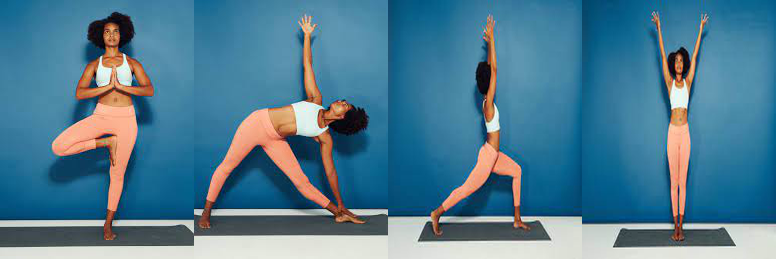

In [ ]:
grid_img(imgs, rows=1, cols=4)

In [ ]:
poses = [pose_model(img) for img in imgs]

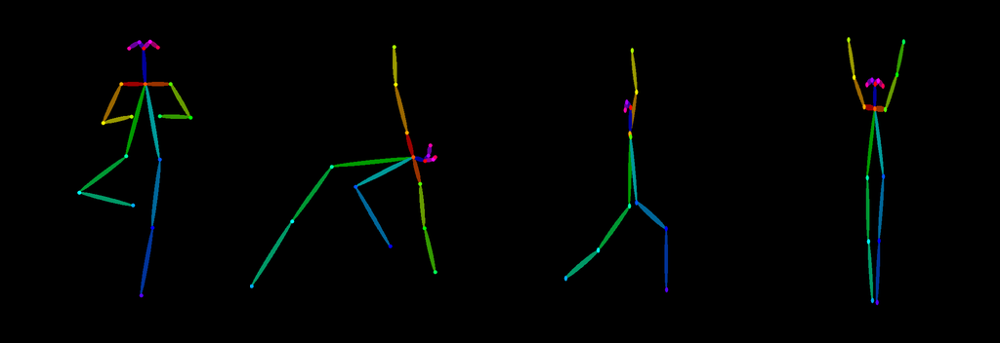

In [ ]:
grid_img(poses, 1, 4, scale = 0.5)

  0%|          | 0/30 [00:00<?, ?it/s]

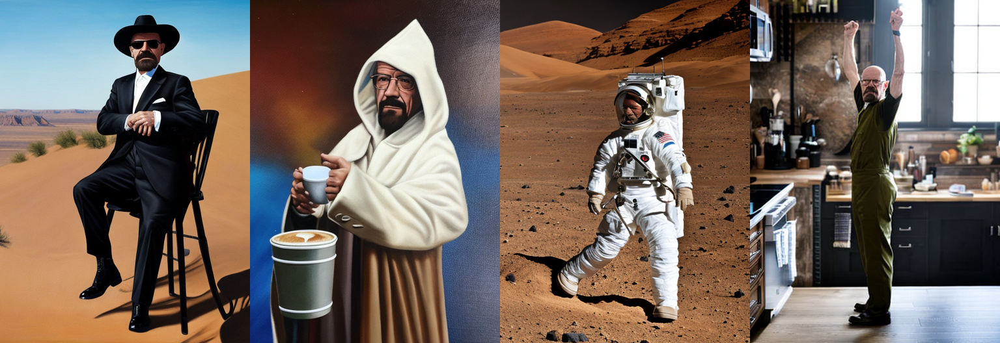

In [ ]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

prompt = ["oil painting walter white wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting walter white wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of walter white wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of walter white in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)


generator = torch.Generator(device="cuda").manual_seed(seed)
output = sd_controlpose(
    prompt,
    poses,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=30,
)
grid_img(output.images, 1, len(prompt), 0.75)

> Sitting pose

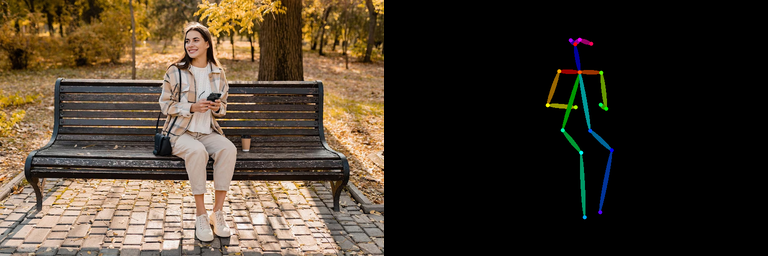

In [ ]:
img_pose = Image.open("bench02_img.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

  0%|          | 0/20 [00:00<?, ?it/s]

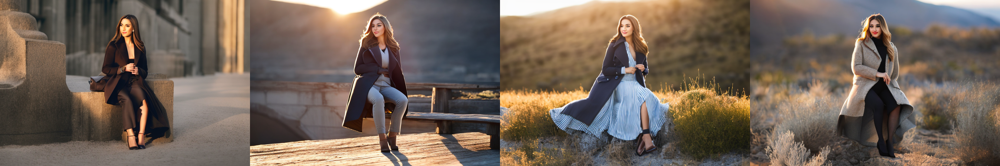

In [ ]:
prompt = "professional photo of a young woman sitting in a , wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)

The other conditioning models you can find here: https://huggingface.co/lllyasviel?search_models=controlnet